#### What are the top 3 insights generated while doing the data analysis on train set (df_train)?

In [23]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

In [30]:
df_test.shape

(10862, 2)

In [2]:

df_train = pd.read_csv('D:/lily/train.csv')
df_test = pd.read_csv('D:/lily/test.csv')

In [28]:
df_train.shape

(43916, 2)

In [19]:
df_train['categories'].value_counts()

Digestive System Diseases                                        4228
Bacterial Infections and Mycoses                                 4181
Wounds and Injuries                                              4086
Animal Diseases                                                  3573
Male Urogenital Diseases                                         3429
Endocrine System Diseases                                        3142
Congenital Hereditary and Neonatal Diseases and Abnormalities    3100
Hemic and Lymphatic Diseases                                     2511
Neoplasms                                                        2228
Chemically-Induced Disorders                                     2143
Stomatognathic Diseases                                          1552
Respiratory Tract Diseases                                       1407
Parasitic Diseases                                               1370
Eye Diseases                                                     1355
Pathological Conditi

C:\Users\win10\anaconda3\envs\yolo\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


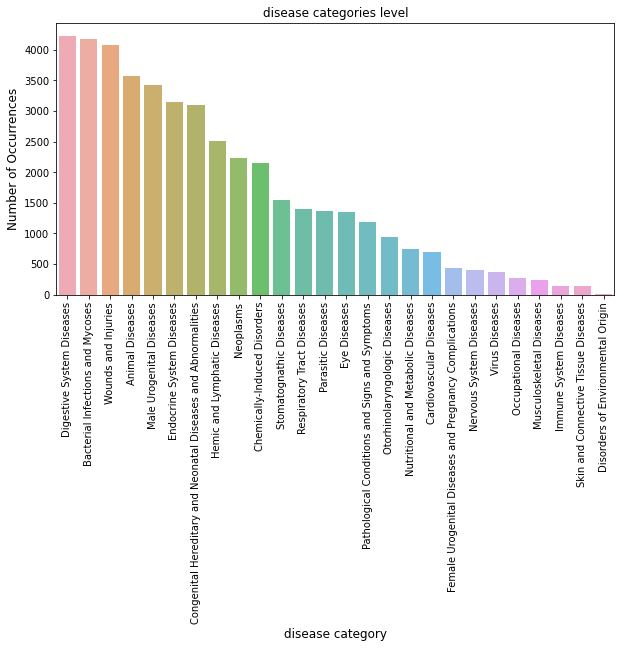

In [25]:
output_cat_count  = df_train['categories'].value_counts()
plt.figure(figsize=(10,5))
sns.barplot(output_cat_count.index, output_cat_count.values, alpha=0.8)
plt.title('disease categories level')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('disease category', fontsize=12)
plt.xticks(rotation=90)
plt.show()

### 1) There are 26 disease categories for output label,which are slightly imbalanced


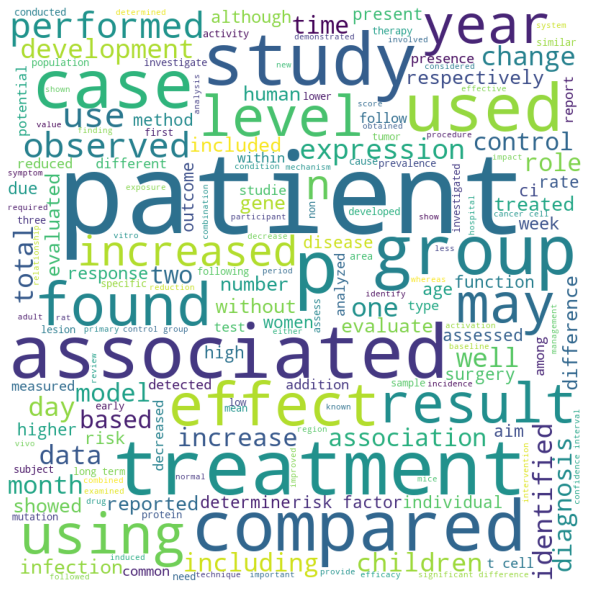

In [11]:
categories = df_train['categories'].value_counts()
comment_words = '' 
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in df_train.abstract: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

### 2) Here, we can see that patients, study, treatment, group cells  disease  cancer  associated  clinical  risk etc..... are the most frequently occurring words for almost every category. it might be a good idea to remove them(add them to stop word list)

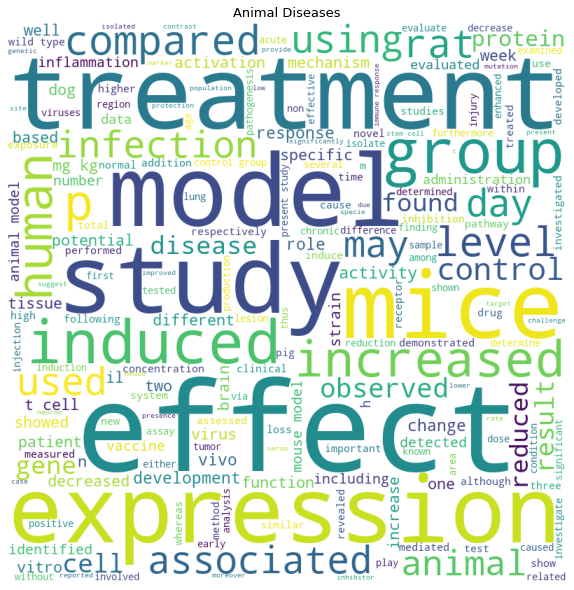

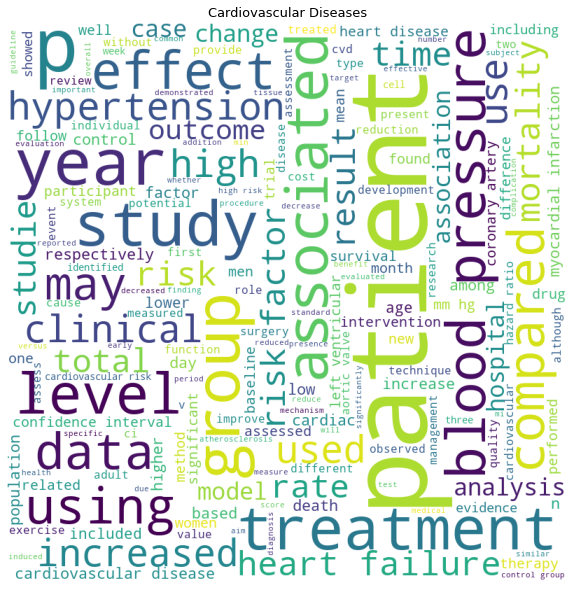

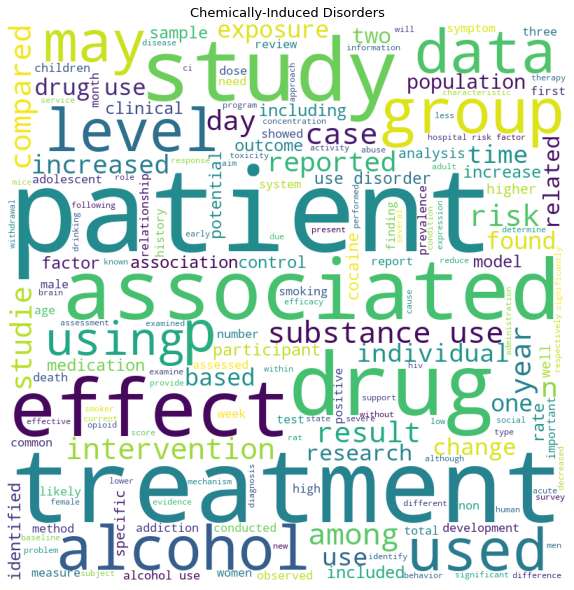

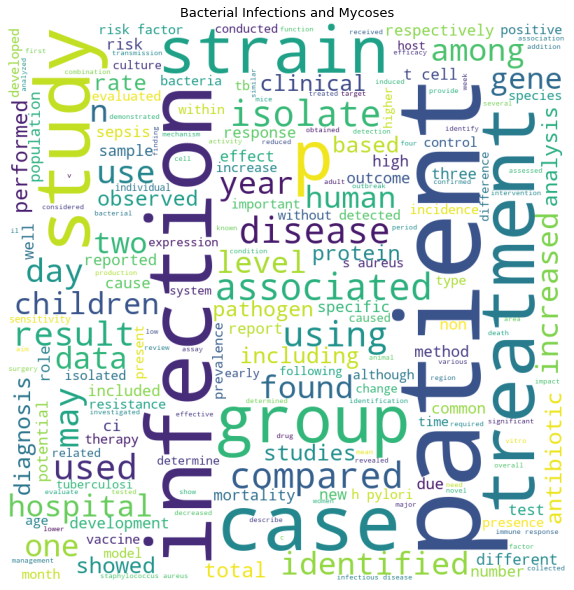

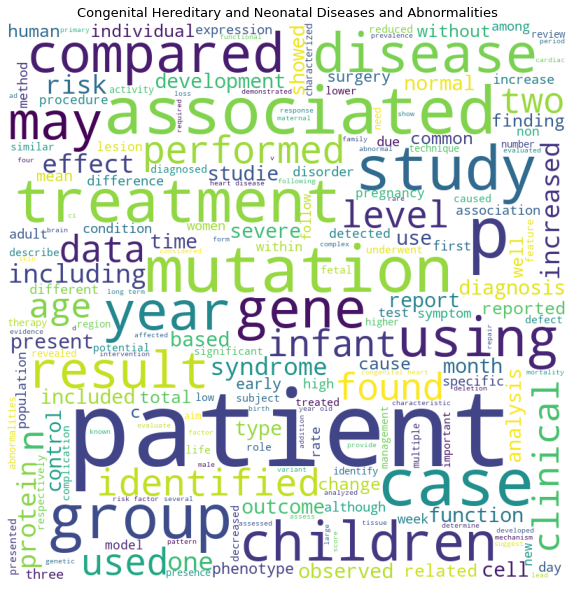

...

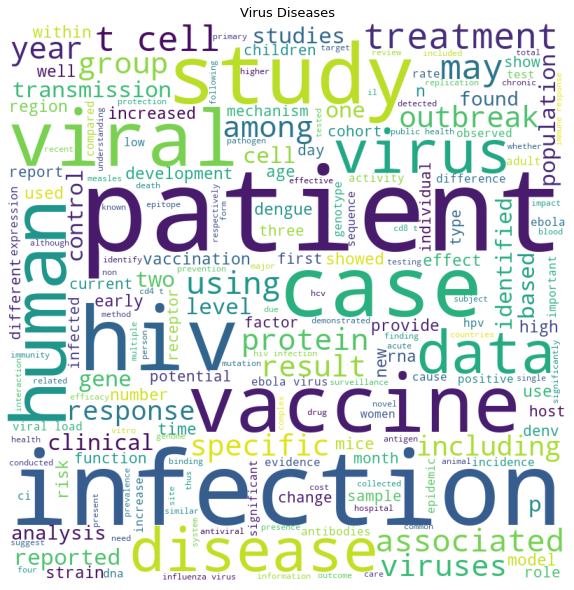

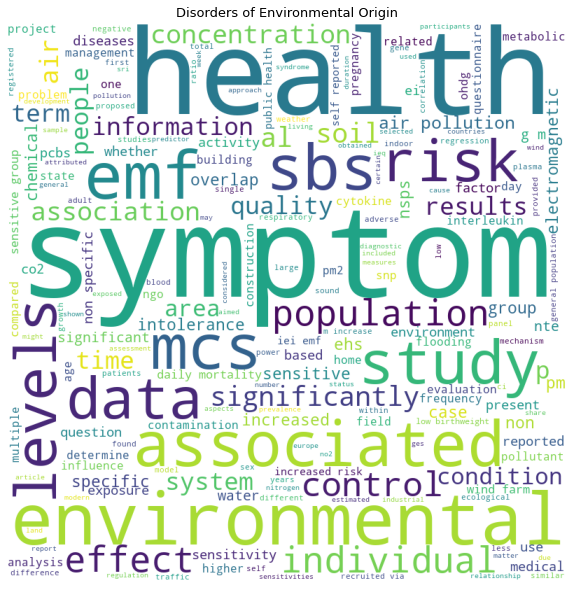

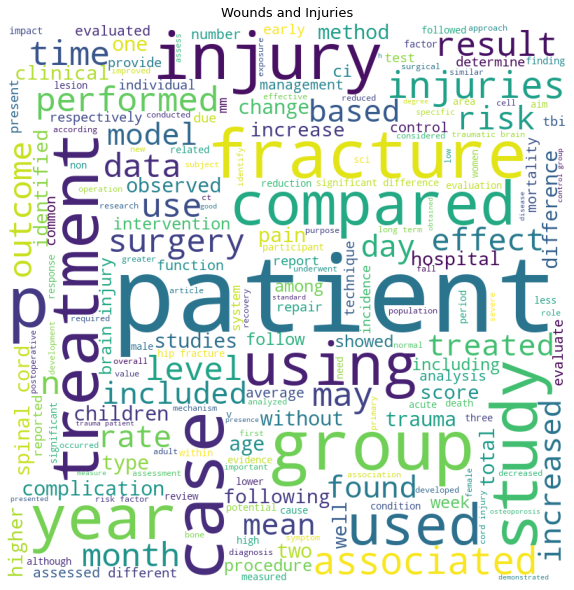

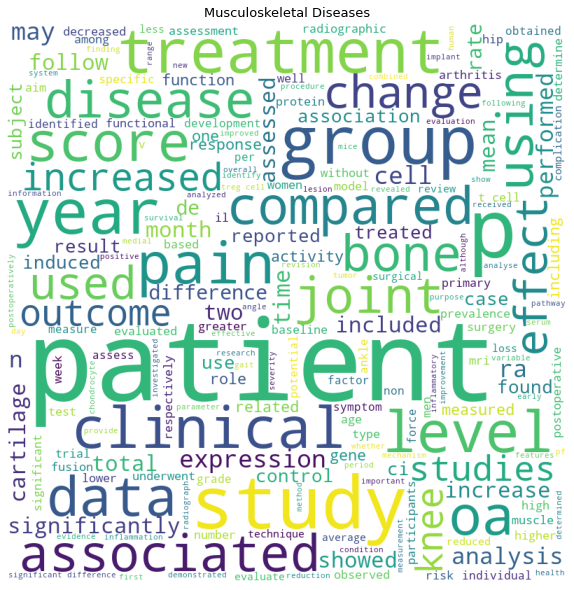

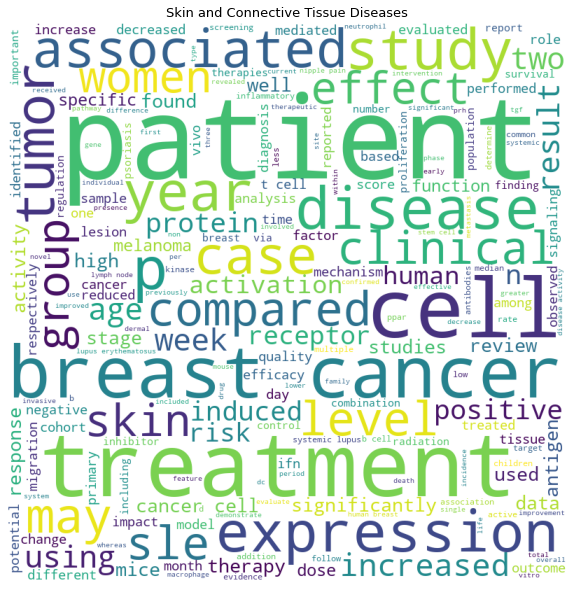

In [13]:

stopwords = set(STOPWORDS) 
for cat in categories:
    comment_words = '' 
# iterate through the csv file 
    for val in df_train[df_train['categories']==cat].abstract: 
      
    # typecaste each val to string 
        val = str(val) 
  
    # split the value 
        tokens = val.split() 
      
    # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 
      
        comment_words += " ".join(tokens)+" "
  
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
  # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.title(cat,fontsize=13)
    plt.tight_layout(pad = 0) 
    plt.show() 

In [17]:
import pickle
with open('D:/lily/vocab_dict.pkl','rb') as f:
    word2idx_inputs = pickle.load(f)

In [27]:
len(word2idx_inputs)

251843

In [18]:
word2idx_inputs

{'patients': 1,
 'study': 2,
 'treatment': 3,
 'p': 4,
 'group': 5,
 'cells': 6,
 'disease': 7,
 'cancer': 8,
 'associated': 9,
 'clinical': 10,
 'risk': 11,
 'using': 12,
 'may': 13,
 'expression': 14,
 'cell': 15,
 'significantly': 16,
 'compared': 17,
 'years': 18,
 'significant': 19,
 'results': 20,
 '1': 21,
 '2': 22,
 'used': 23,
 'data': 24,
 'increased': 25,
 'levels': 26,
 'cases': 27,
 'also': 28,
 'analysis': 29,
 'studies': 30,
 '95': 31,
 'age': 32,
 'use': 33,
 'two': 34,
 'showed': 35,
 'higher': 36,
 'however': 37,
 'control': 38,
 'ci': 39,
 '3': 40,
 'high': 41,
 'patient': 42,
 'found': 43,
 'groups': 44,
 'among': 45,
 'therapy': 46,
 'mice': 47,
 'factors': 48,
 'time': 49,
 'one': 50,
 'effects': 51,
 'mean': 52,
 'infection': 53,
 'performed': 54,
 'months': 55,
 'total': 56,
 'rate': 57,
 'health': 58,
 'effect': 59,
 'protein': 60,
 'model': 61,
 'tumor': 62,
 'including': 63,
 'respectively': 64,
 'children': 65,
 'blood': 66,
 'role': 67,
 'survival': 68,
 'a

### 3) The majority of abstracts are written in  English langugae
### we also have abstract written in languages like  Hungarian, frenach,German,Spanish,Italian and Catalan 

In [26]:
lang = pd.read_csv('D:/lily/language_detection.csv')
lang['language'].value_counts()

en    43744
fr       81
hu       46
de       24
es       19
it        1
ca        1
Name: language, dtype: int64

## What are the top 3 data challenges you observe on train set?

#### 1) Output class labels are slighly imbalanced
#### 2) Dataset size is 43916, vocabulary size is 251843 and there are 26 levels in ouput variable, which might make the  model building task difficult
#### 3) Corpus also contains languages other than english such as Hungarian, frenach,German,Spanish,Italian and Catalan.(we might need some extra effort to analyse these corpus )
#### 4)since we are using medical journal in our corpus, its  difficult to obtain good pre-trained embeddings for the vocabulary
#### 5) we cant use the features extracted from pretrained-models like word2vec, fatstext and Bert etc..for model training. it has to be either fine tuned or should be trained from scratch